# Variability and custom types

## Goals for today
- How to summarise a probability distribution
- Different kinds of random walkers
 
- Defining custom types in Julia
- Writing generic code

## Variability
- We have **finite sample** from ideal **population**
- If we repeat experiment, get different sample with different counts.
- How characterize this *variability*?


### Shape of distribution
- See that position "clusters around" central value: **expected value**
- Values near extremes "never" occur
- Characterise using **summary statistics**: numbers that summarise aspects of **distribution**
- Simplest: **sample mean** = average value

### Mean
Given oucomes $x_i$ for $i = 1, ..., N$, (arithimetic) mean is 
 
 $\bar x := \frac1N \sum_{i=1}^N x_i$

Calculate in Julia: 

`mean(data) = sum(data) / length(data)`
 
`m = sum(n1_data) / length(n1_data)`

NB: `mean` is in `Statistics` standard library (no need to install)

Add to plot using `vline!([m])`

In [1]:
function walk(num_steps)
    x = 0
    
    for i in 1:num_steps
        x += rand( (-1, 1) )
    end
    
    return x
end

walk (generic function with 1 method)

In [2]:
num_steps = 20
walk(num_steps)

0

In [3]:
experiment(num_steps, num_walks) = [walk(num_steps) for i in 1:num_walks]

experiment (generic function with 1 method)

In [4]:
data = experiment(20,1000)
data' # ' = transpose 

1×1000 adjoint(::Vector{Int64}) with eltype Int64:
 -2  -6  -4  6  -2  4  -2  2  2  -2  6  …  -2  6  10  -8  -8  2  2  4  2  2

In [5]:
using StatsBase

In [6]:
counts = countmap(data);

In [7]:
using Plots

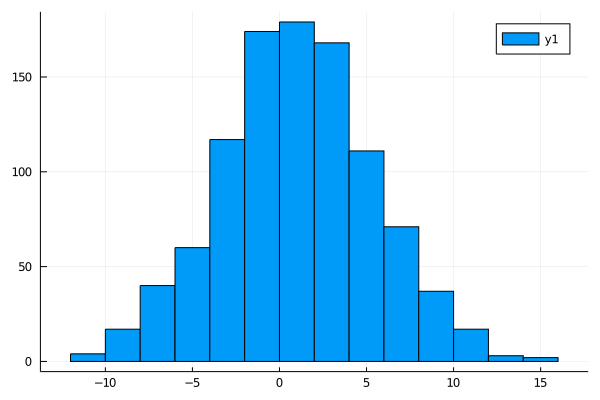

In [8]:
histogram(data, bins = 20)

In [9]:
h = fit(Histogram, data)

Histogram{Int64, 1, Tuple{StepRangeLen{Float64, Base.TwicePrecision{Float64}, Base.TwicePrecision{Float64}}}}
edges:
  -15.0:5.0:15.0
weights: [4, 117, 291, 458, 108, 22]
closed: left
isdensity: false

In [10]:
h.weights / sum(h.weights)

6-element Vector{Float64}:
 0.004
 0.117
 0.291
 0.458
 0.108
 0.022

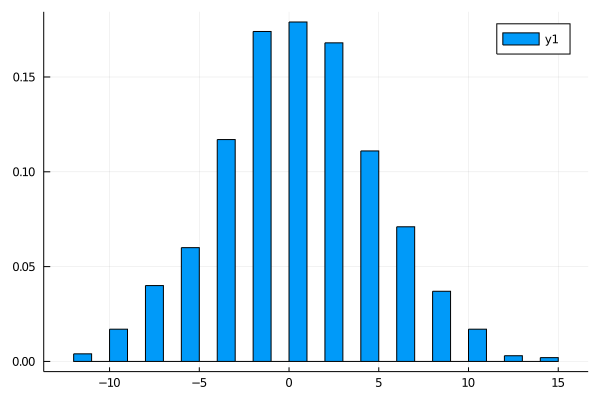

In [11]:
histogram(data, bins = 40, normed=true)

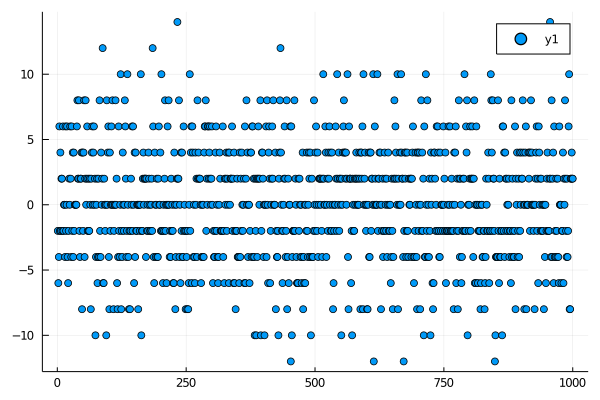

In [12]:
scatter(data)

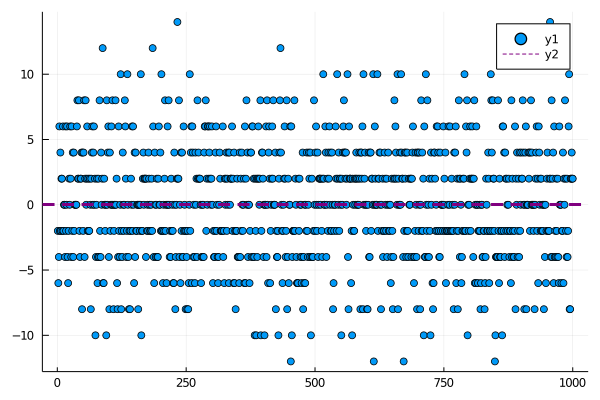

In [13]:
 hline!([mean(data)], lw=3, ls=:dash, c=:purple)

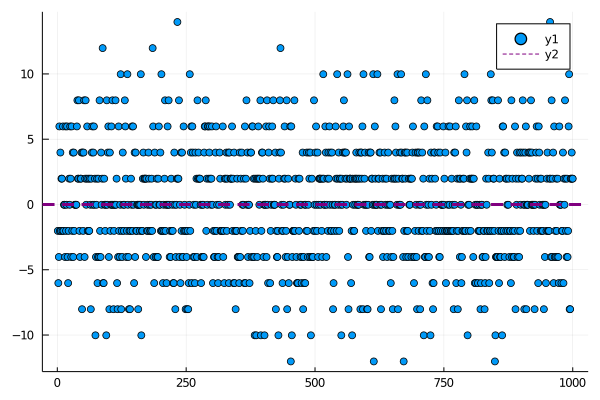

In [14]:
μ = mean(data)
centred_data = data .- μ # de-mean: subtract
scatter(centred_data)
hline!([mean(centred_data)], lw=3, ls=:dash, c=:purple)

In [15]:
nextfloat(1.0)

1.0000000000000002

In [16]:
nextfloat(1.0) - 1.0 # machine epsilon for double precision -- Float64

2.220446049250313e-16

In [17]:
abs_data = abs.(centred_data)

1000-element Vector{Float64}:
 2.022
 6.022
 4.022
 5.978
 2.022
 3.978
 2.022
 1.978
 1.978
 2.022
 5.978
 2.022
 0.022
 ⋮
 1.978
 4.022
 2.022
 5.978
 9.978
 8.022
 8.022
 1.978
 1.978
 3.978
 1.978
 1.978

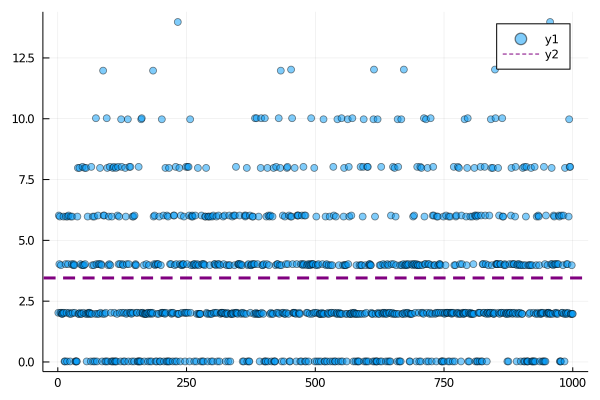

In [18]:
scatter(abs_data, alpha = .5)
hline!([mean(abs_data)], c=:purple, ls=:dash, lw=3)

In [26]:
μ = mean(abs_data)
count(abs_data .< μ) / length(abs_data)

0.521

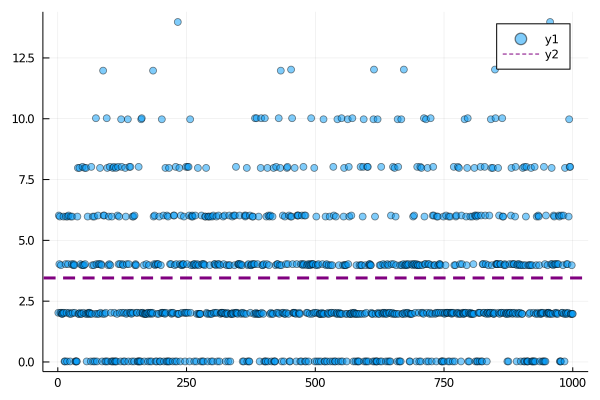

In [27]:
scatter(abs_data, alpha = .5)
hline!([μ],lw=3,ls=:dash,c=:purple)

In [28]:
count(abs_data .< 2μ) / length(abs_data)

0.88

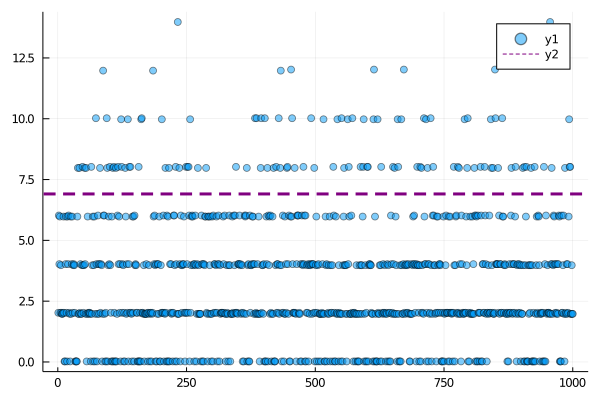

In [29]:
scatter(abs_data, alpha = .5)
hline!([2μ],lw=3,ls=:dash,c=:purple)

In [30]:
squared_data = abs_data .^2

1000-element Vector{Float64}:
  4.088483999999999
 36.264484
 16.176484000000002
 35.736484
  4.088483999999999
 15.824484000000002
  4.088483999999999
  3.912484
  3.912484
  4.088483999999999
 35.736484
  4.088483999999999
  0.00048399999999999995
  ⋮
  3.912484
 16.176484000000002
  4.088483999999999
 35.736484
 99.56048399999999
 64.352484
 64.352484
  3.912484
  3.912484
 15.824484000000002
  3.912484
  3.912484

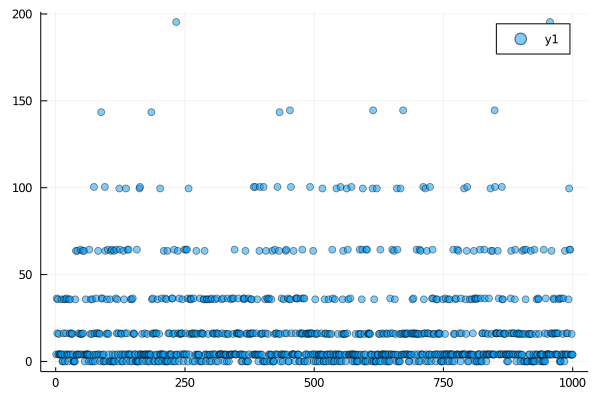

In [31]:
scatter(squared_data, alpha = .5)

In [42]:
data = experiment(50, 10^6);

In [48]:
μ = mean(data)

variance = mean((data .- μ).^2)

σ = √(variance)

7.0738436572712

In [49]:
[(μ - σ) < x < (μ + σ) for x in data];

In [51]:
count((μ - σ) .< data .< (μ + σ)) / length(data)

0.677254

In [53]:
data2 = data[1:10_000];

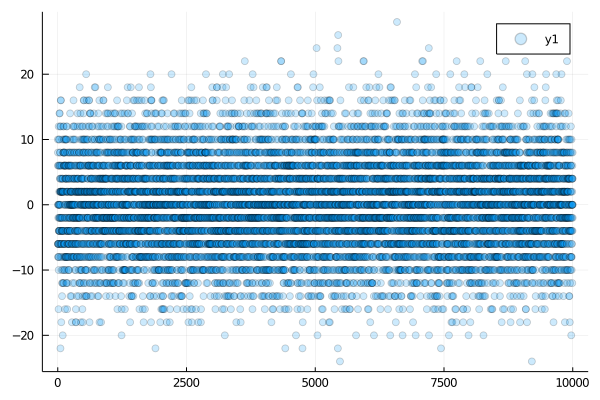

In [54]:
scatter(data2, alpha=0.2)

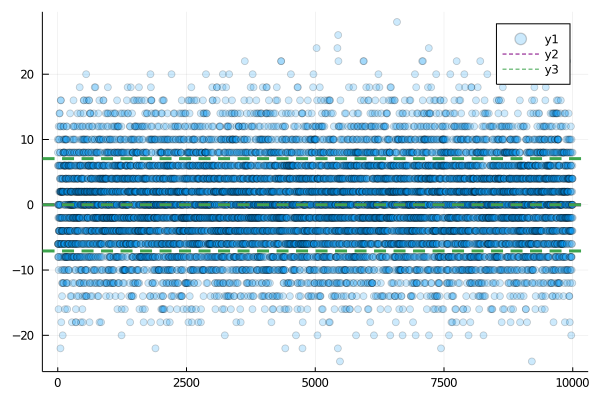

In [57]:
hline!([μ, μ+σ, μ-σ], lw=3, ls=:dash)

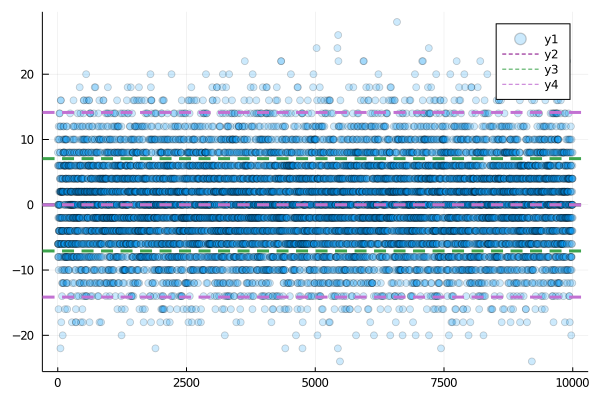

In [58]:
hline!([μ, μ+2σ, μ-2σ], lw=3, ls=:dash)

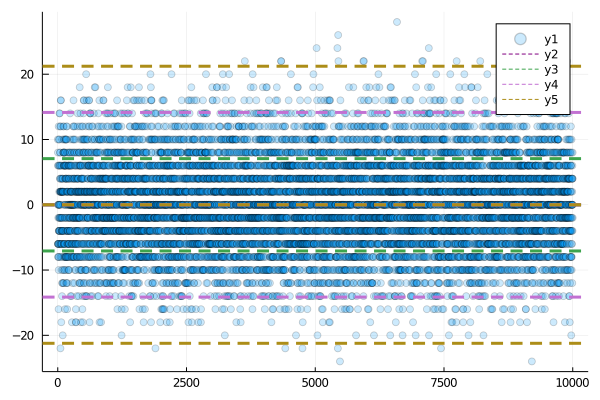

In [59]:
hline!([μ, μ+3σ, μ-3σ], lw=3, ls=:dash)

## Standard error of the mean

$N$ data points sampled from the same distribution, calculate the mean

In [68]:
nₛₜₑₚₛ = 20
N = 100

data = experiment(nₛₜₑₚₛ, N)

μ = mean(data)

0.4

In [69]:
nₛₜₑₚₛ = 20
N = 1000

data = experiment(nₛₜₑₚₛ, N)

μ = mean(data)

-0.156

In [70]:
using Statistics

In [72]:
σ = std(data)

4.344483690674707

$X_1 + X_2 + ... + X_N$

In [73]:
standard_error_of_mean = σ / √N

0.137384637199865

In [75]:
mean_data = [mean(experiment(nₛₜₑₚₛ, N)) for i in 1:1000];

In [77]:
std(mean_data)

0.13780030576260807

## Defining new types in Julia

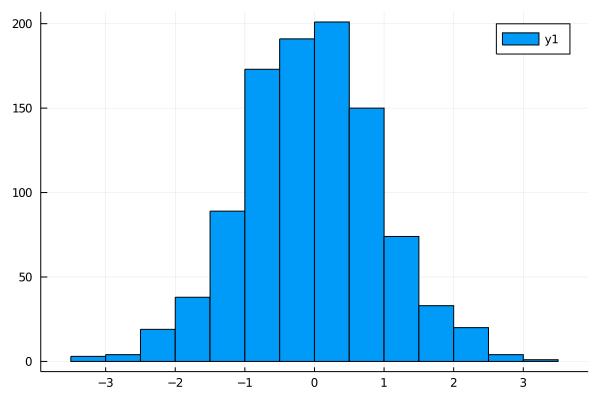

In [81]:
histogram(randn(1000)) # Ziggurat algorithm for normally distributed random numbers

# See also Distribution.jl

How to write **generic** code? A single `walk` function to generate random wlak that works with discrete and continuous distributions

In [83]:
discrete_jump() = rand( (-1, +1) )

continuous_jump() = randn()

continuous_jump (generic function with 1 method)

In [84]:
function walk(N)
    x = 0 
    
    for i in 1:N
        x += jump() 
    end
    
    return x
end
    

walk (generic function with 1 method)

In [85]:
# DON'T DO THIS!

function walk(N, walker_type)
    
    if walker_type == "discrete"
        ...
    end
end

LoadError: syntax: invalid identifier name "..."

In [86]:
function walk(N, jump)
    x = 0
    
    for i in 1:N
        x += jump()
    end
    
    return x
end     

walk (generic function with 2 methods)

In [87]:
walk(10, discrete_jump)

2

In [88]:
walk(10, continuous_jump)

3.935259305725637

## Cumstom types/ user-defined types / composite types

Julia has **objects** (of user-defined types), but **not** object-oriented programming language

In [89]:
struct MyDiscreteRandomWalker
    x::Int # type annotation: x is of type Integer
end

"Box with data inside"

To make an object of this type:

In [92]:
w = MyDiscreteRandomWalker(10)

MyDiscreteRandomWalker(10)

In [93]:
w

MyDiscreteRandomWalker(10)

In [94]:
w.x

10

Move the walker:

In [96]:
w.x = w.x + 1

LoadError: setfield! immutable struct of type MyDiscreteRandomWalker cannot be changed

In [97]:
mutable struct MyDiscreteRandomWalker2
    x::Int
end

In [98]:
w = MyDiscreteRandomWalker2(10)

MyDiscreteRandomWalker2(10)

In [99]:
w.x += 1

11

In [100]:
jump!(w::MyDiscreteRandomWalker2) = w.x += rand( (-1,+1) )

jump! (generic function with 1 method)

In [101]:
function jump!(w::MyDiscreteRandomWalker2) # takes arg of type MyDiscreteRandomWalker2
    w.x += rand( (-1,1) )
    return w
end

jump! (generic function with 1 method)

In [103]:
w

MyDiscreteRandomWalker2(11)

In [104]:
jump!(w)

MyDiscreteRandomWalker2(12)

In [105]:
w

MyDiscreteRandomWalker2(12)

In [106]:
function walk!(w::MyDiscreteRandomWalker2, N)
    for i in 1:N
        jump!(w)
    end
end

walk! (generic function with 1 method)

In [108]:
MyDiscreteRandomWalker2() = MyDiscreteRandomWalker2(0) # alter-constructor

MyDiscreteRandomWalker2

In [109]:
methods(MyDiscreteRandomWalker2)

# 3 methods for type constructor:
[1] MyDiscreteRandomWalker2() in Main at In[108]:1
[2] MyDiscreteRandomWalker2(x::Int64) in Main at In[97]:2
[3] MyDiscreteRandomWalker2(x) in Main at In[97]:2

In [110]:
w = MyDiscreteRandomWalker2()

MyDiscreteRandomWalker2(0)

In [111]:
w2 = MyDiscreteRandomWalker2()

MyDiscreteRandomWalker2(0)

In [112]:
isequal(w,w2)

false

In [113]:
isequal(w,w)

true